Variable HOMEstofs not found in mappings.
Variable HOMEstofs not found in mappings.
Variable HOMEstofs not found in mappings.
Variable HOMEstofs not found in mappings.
Variable HOMEstofs not found in mappings.
Variable SCRIstofs3d not found in mappings.
Variable SCRIstofs3d not found in mappings.
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_param_nml.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_bctides_in.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_river_forcing_nwm.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_surface_forcing_gfs.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_surface_forcing_hrrr.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_river_st_lawrence.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_obc_3d_th.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to s

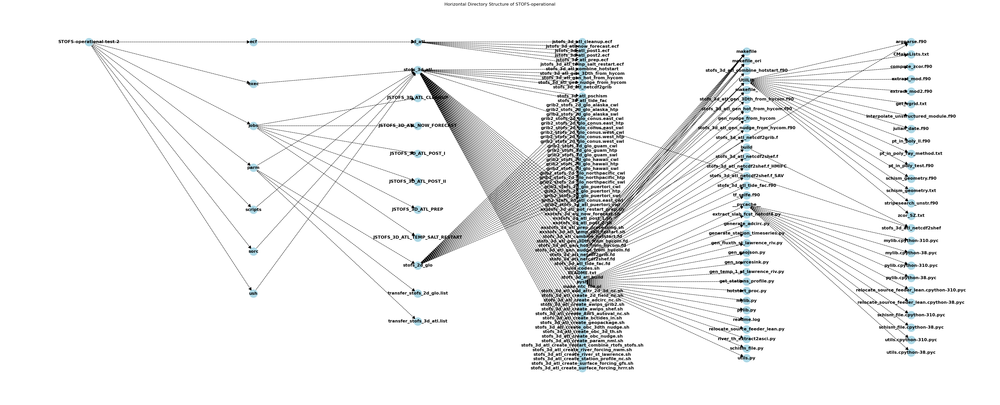

In [20]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/
    for line in lines:
        matches = re.findall(r'^\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                called_file_path = os.path.join(root_dir, base_path, called_file_part)
                called_file_path = os.path.normpath(called_file_path)
                called_file_name = os.path.basename(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='red', style='solid', arrowstyle='-|>', arrowsize=20)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_NOW_FORECAST
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_I
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_II
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_PREP
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_TEMP_SALT_RESTART
Adding edge from JSTOFS_3D_ATL_NOW_FORECAST to exstofs_3d_atl_now_forecast.sh
Adding edge from JSTOFS_3D_ATL_POST_II to exstofs_3d_atl_post_2.sh
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not found in mappings.
Variable USHstofs3d not foun

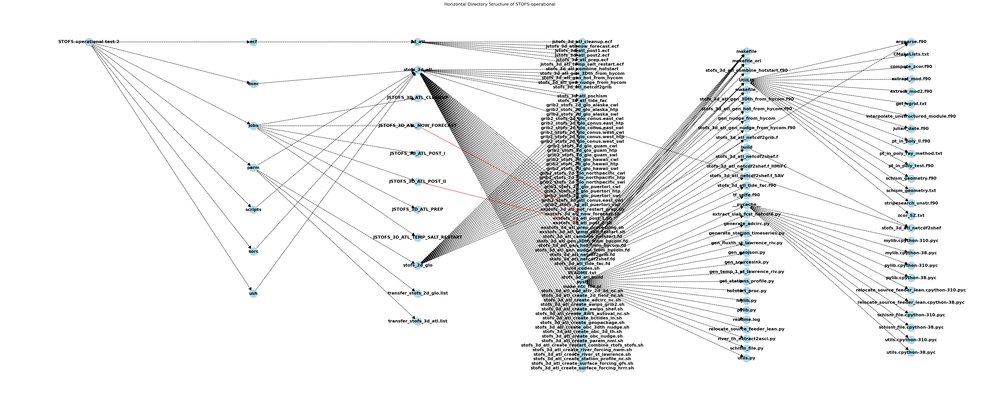

In [21]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/
    for line in lines:
        matches = re.findall(r'^\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                called_file_path = os.path.join(root_dir, base_path, called_file_part)
                called_file_path = os.path.normpath(called_file_path)
                called_file_name = os.path.basename(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='red', style='solid', arrowstyle='-|>', arrowsize=20)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_NOW_FORECAST
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_I
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_II
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_PREP
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_TEMP_SALT_RESTART
Adding edge from JSTOFS_3D_ATL_NOW_FORECAST to exstofs_3d_atl_now_forecast.sh
Adding edge from JSTOFS_3D_ATL_POST_II to exstofs_3d_atl_post_2.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_param_nml.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_bctides_in.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs_3d_atl_create_river_forcing_nwm.sh
Adding edge from exstofs_3d_atl_prep_processing.sh to stofs

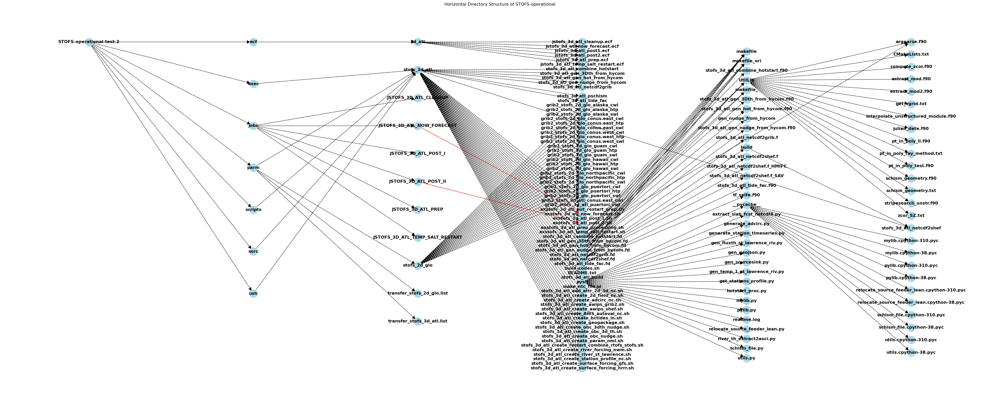

In [22]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/
    for line in lines:
        matches = re.findall(r'^\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                called_file_path = os.path.join(root_dir, base_path, called_file_part)
                called_file_path = os.path.normpath(called_file_path)
                called_file_name = os.path.basename(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='red', style='solid', arrowstyle='-|>', arrowsize=20)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_NOW_FORECAST in file jstofs_3d_atl_now_forecast.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_NOW_FORECAST
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_I in file jstofs_3d_atl_post1.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_I
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_II in file jstofs_3d_atl_post2.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_II
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_PREP in file jstofs_3d_atl_prep.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_PREP
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_TEMP_SALT_RESTART in file jstofs_3d_atl_temp_salt_restart.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_TEMP_SALT_RESTART
Found match: SCRIstofs3d/exstofs_3d

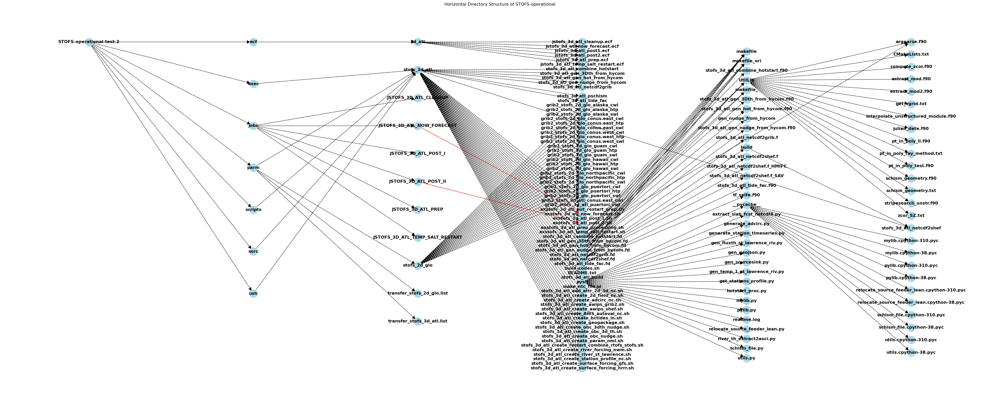

In [23]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/
    for line in lines:
        matches = re.findall(r'^\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            print(f"Found match: {variable}/{called_file_part} in file {file}")
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                called_file_path = os.path.join(root_dir, base_path, called_file_part)
                called_file_path = os.path.normpath(called_file_path)
                called_file_name = os.path.basename(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='red', style='solid', arrowstyle='-|>', arrowsize=20)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_NOW_FORECAST in file jstofs_3d_atl_now_forecast.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_NOW_FORECAST
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_I in file jstofs_3d_atl_post1.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_I
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_II in file jstofs_3d_atl_post2.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_POST_II
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_PREP in file jstofs_3d_atl_prep.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_PREP
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_TEMP_SALT_RESTART in file jstofs_3d_atl_temp_salt_restart.ecf
File not found: C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2\jobs\jobs\JSTOFS_3D_ATL_TEMP_SALT_RESTART
Found match: SCRIstofs3d/exstofs_3d

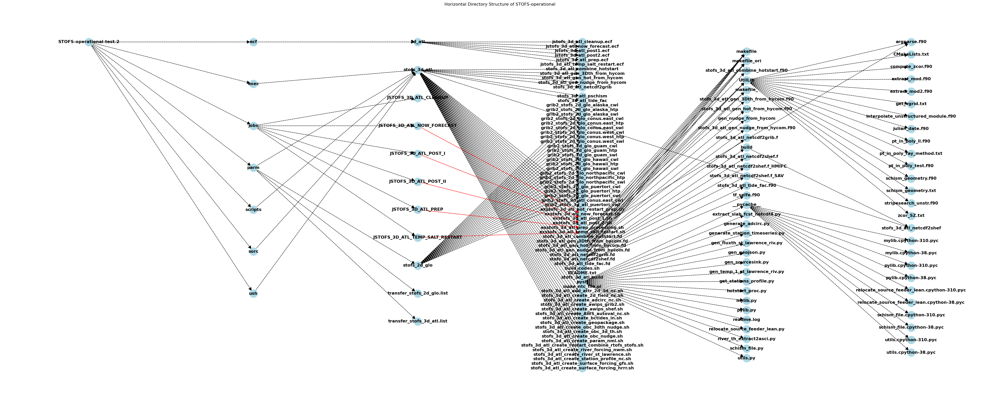

In [24]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/, allowing for optional leading spaces
    for line in lines:
        matches = re.findall(r'^\s*\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            print(f"Found match: {variable}/{called_file_part} in file {file}")
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                called_file_path = os.path.join(root_dir, base_path, called_file_part)
                called_file_path = os.path.normpath(called_file_path)
                called_file_name = os.path.basename(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='red', style='solid', arrowstyle='-|>', arrowsize=20)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_NOW_FORECAST in file jstofs_3d_atl_now_forecast.ecf
Adding edge from jstofs_3d_atl_now_forecast.ecf to JSTOFS_3D_ATL_NOW_FORECAST
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_I in file jstofs_3d_atl_post1.ecf
Adding edge from jstofs_3d_atl_post1.ecf to JSTOFS_3D_ATL_POST_I
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_II in file jstofs_3d_atl_post2.ecf
Adding edge from jstofs_3d_atl_post2.ecf to JSTOFS_3D_ATL_POST_II
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_PREP in file jstofs_3d_atl_prep.ecf
Adding edge from jstofs_3d_atl_prep.ecf to JSTOFS_3D_ATL_PREP
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_TEMP_SALT_RESTART in file jstofs_3d_atl_temp_salt_restart.ecf
Adding edge from jstofs_3d_atl_temp_salt_restart.ecf to JSTOFS_3D_ATL_TEMP_SALT_RESTART
Found match: SCRIstofs3d/exstofs_3d_atl_now_forecast.sh in file JSTOFS_3D_ATL_NOW_FORECAST
Adding edge from JSTOFS_3D_ATL_NOW_FORECAST to exstofs_3d_atl_now_forecast.sh
Found match: SCRIstofs3d/exstofs_

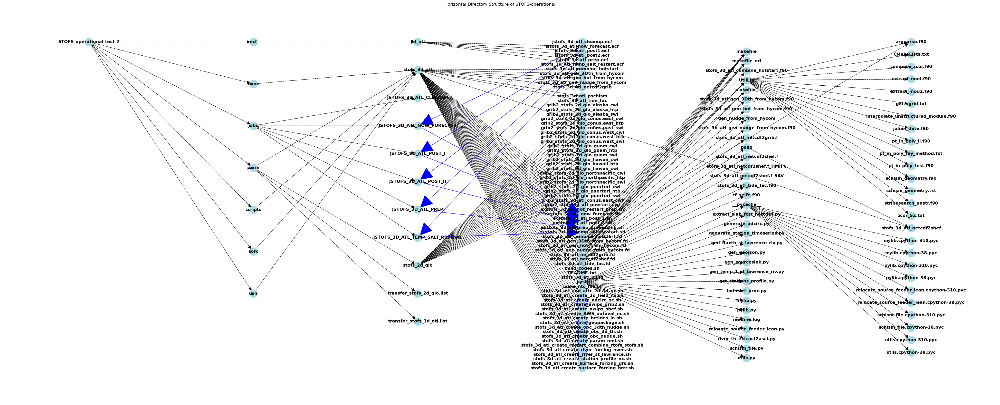

In [26]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name)

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir)
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file)
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/, allowing for optional leading spaces
    for line in lines:
        matches = re.findall(r'^\s*\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            print(f"Found match: {variable}/{called_file_part} in file {file}")
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                # Extract only the file name from the called_file_part
                called_file_name = os.path.basename(called_file_part)
                called_file_path = os.path.join(root_dir, base_path, called_file_name)
                called_file_path = os.path.normpath(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name)
                    graph.add_edge(file, called_file_name, color='red', style='solid')  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='blue', style='solid', arrowstyle='-|>', arrowsize=80)

plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_NOW_FORECAST in file jstofs_3d_atl_now_forecast.ecf
Adding edge from jstofs_3d_atl_now_forecast.ecf to JSTOFS_3D_ATL_NOW_FORECAST
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_I in file jstofs_3d_atl_post1.ecf
Adding edge from jstofs_3d_atl_post1.ecf to JSTOFS_3D_ATL_POST_I
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_II in file jstofs_3d_atl_post2.ecf
Adding edge from jstofs_3d_atl_post2.ecf to JSTOFS_3D_ATL_POST_II
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_PREP in file jstofs_3d_atl_prep.ecf
Adding edge from jstofs_3d_atl_prep.ecf to JSTOFS_3D_ATL_PREP
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_TEMP_SALT_RESTART in file jstofs_3d_atl_temp_salt_restart.ecf
Adding edge from jstofs_3d_atl_temp_salt_restart.ecf to JSTOFS_3D_ATL_TEMP_SALT_RESTART
Found match: SCRIstofs3d/exstofs_3d_atl_now_forecast.sh in file JSTOFS_3D_ATL_NOW_FORECAST
Adding edge from JSTOFS_3D_ATL_NOW_FORECAST to exstofs_3d_atl_now_forecast.sh
Found match: SCRIstofs3d/exstofs_

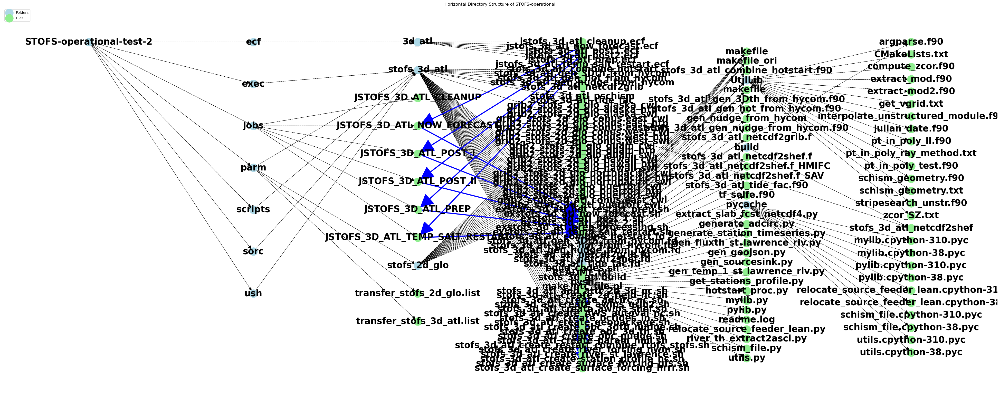

In [27]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name, node_type='folder')

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir, node_type='folder')
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file, node_type='file')
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/, allowing for optional leading spaces
    for line in lines:
        matches = re.findall(r'^\s*\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            print(f"Found match: {variable}/{called_file_part} in file {file}")
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                # Extract only the file name from the called_file_part
                called_file_name = os.path.basename(called_file_part)
                called_file_path = os.path.join(root_dir, base_path, called_file_name)
                called_file_path = os.path.normpath(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name, node_type='file')
                    graph.add_edge(file, called_file_name, color='blue', style='solid', width=3)  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes with different colors for folders and files
folder_nodes = [node for node, attr in G.nodes(data=True) if attr['node_type'] == 'folder']
file_nodes = [node for node, attr in G.nodes(data=True) if attr['node_type'] == 'file']

nx.draw_networkx_nodes(G, pos, nodelist=folder_nodes, node_size=500, node_color='lightblue', label='Folders')
nx.draw_networkx_nodes(G, pos, nodelist=file_nodes, node_size=500, node_color='lightgreen', label='Files')
nx.draw_networkx_labels(G, pos, font_size=25, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='blue', style='solid', width=3, arrowstyle='-|>', arrowsize=80)

plt.legend(loc='upper left')
plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph


Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_NOW_FORECAST in file jstofs_3d_atl_now_forecast.ecf
Adding edge from jstofs_3d_atl_now_forecast.ecf to JSTOFS_3D_ATL_NOW_FORECAST
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_I in file jstofs_3d_atl_post1.ecf
Adding edge from jstofs_3d_atl_post1.ecf to JSTOFS_3D_ATL_POST_I
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_POST_II in file jstofs_3d_atl_post2.ecf
Adding edge from jstofs_3d_atl_post2.ecf to JSTOFS_3D_ATL_POST_II
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_PREP in file jstofs_3d_atl_prep.ecf
Adding edge from jstofs_3d_atl_prep.ecf to JSTOFS_3D_ATL_PREP
Found match: HOMEstofs/jobs/JSTOFS_3D_ATL_TEMP_SALT_RESTART in file jstofs_3d_atl_temp_salt_restart.ecf
Adding edge from jstofs_3d_atl_temp_salt_restart.ecf to JSTOFS_3D_ATL_TEMP_SALT_RESTART
Found match: SCRIstofs3d/exstofs_3d_atl_now_forecast.sh in file JSTOFS_3D_ATL_NOW_FORECAST
Adding edge from JSTOFS_3D_ATL_NOW_FORECAST to exstofs_3d_atl_now_forecast.sh
Found match: SCRIstofs3d/exstofs_

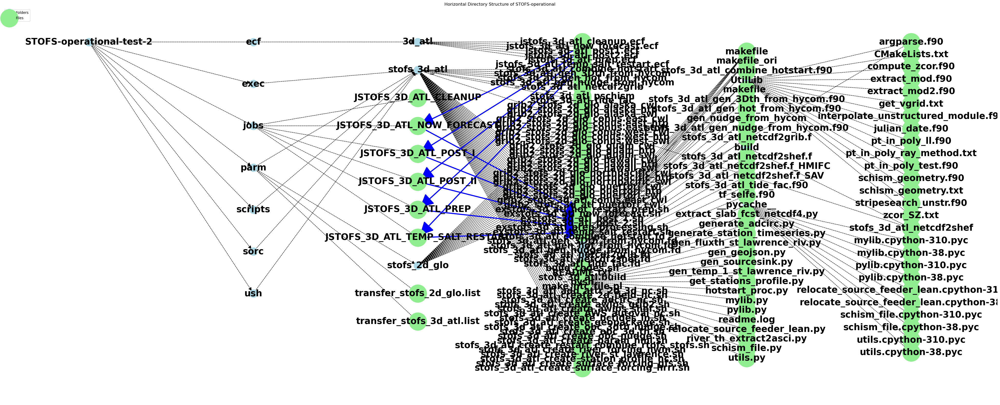

In [28]:
import os
import re
import networkx as nx
import matplotlib.pyplot as plt

# Define the mappings for the variable parts to their corresponding directories
variable_mappings = {
    'HOMEstofs': 'jobs',
    'SCRIstofs3d': 'scripts/stofs_3d_atl',
    'USHstofs3d': 'ush/stofs_3d_atl',
    # Add more mappings here as needed
}

def add_nodes_and_edges(root_dir, graph):
    levels = {}  # This will store nodes by their level
    root_level = root_dir.count(os.sep)  # Base level of the root directory
    for subdir, dirs, files in os.walk(root_dir):
        # Skip the .git directory
        if '.git' in subdir.split(os.sep):
            continue
        
        # Calculate the depth level based on the number of separators
        level = subdir.count(os.sep) - root_level
        if level not in levels:
            levels[level] = []
        
        # Get the name of the current directory
        dir_name = os.path.basename(subdir)
        if dir_name not in levels[level]:
            levels[level].append(dir_name)
        
        graph.add_node(dir_name, node_type='folder')

        # Add directories as nodes and edges from parent directory
        for dir in dirs:
            # Skip the .git directory
            if dir == '.git':
                continue
            graph.add_node(dir, node_type='folder')
            graph.add_edge(dir_name, dir, color='black', style='dashed')  # Regular directory edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if dir not in levels[level + 1]:
                levels[level + 1].append(dir)
        
        # Add files as nodes and edges from their respective directories
        for file in files:
            graph.add_node(file, node_type='file')
            graph.add_edge(dir_name, file, color='black', style='dashed')  # Regular file edge
            if level + 1 not in levels:
                levels[level + 1] = []
            if file not in levels[level + 1]:
                levels[level + 1].append(file)
            
            # If the file contains strings like ${...}/, parse it for file calls
            parse_file_for_variable_calls(file, subdir, root_dir, graph)

    return levels

def parse_file_for_variable_calls(file, subdir, root_dir, graph):
    full_path = os.path.join(subdir, file)
    try:
        with open(full_path, 'r', encoding='utf-8') as file_obj:
            lines = file_obj.readlines()
    except UnicodeDecodeError:
        with open(full_path, 'r', encoding='latin1') as file_obj:
            lines = file_obj.readlines()
    
    # Regex to find file calls within the file that use ${...}/, allowing for optional leading spaces
    for line in lines:
        matches = re.findall(r'^\s*\$\{([^}]+)\}/(\S+)', line)
        for variable, called_file_part in matches:
            print(f"Found match: {variable}/{called_file_part} in file {file}")
            if variable in variable_mappings:
                base_path = variable_mappings[variable]
                # Extract only the file name from the called_file_part
                called_file_name = os.path.basename(called_file_part)
                called_file_path = os.path.join(root_dir, base_path, called_file_name)
                called_file_path = os.path.normpath(called_file_path)
                if os.path.exists(called_file_path):
                    graph.add_node(called_file_name, node_type='file')
                    graph.add_edge(file, called_file_name, color='blue', style='solid', width=3)  # Different color and style for file call edges
                    print(f"Adding edge from {file} to {called_file_name}")
                else:
                    print(f"File not found: {called_file_path}")
            else:
                print(f"Variable {variable} not found in mappings.")

# Layout nodes such that nodes are arranged from left to right based on their levels
def custom_layout(levels, width=5, height=2):
    pos = {}
    x_offset = 0
    for level, nodes in sorted(levels.items()):
        y_step = height / (len(nodes) + 1)
        y = height / 2
        for node in nodes:
            pos[node] = (x_offset, y)
            y -= y_step
        x_offset += width
    return pos

# Initialize a directed graph
G = nx.DiGraph()

# Set the path to the root of your directory structure
repo_path = r'C:\Users\armaghan.abed-elmdou\STOFS-operational-test-2'  # Adjust this path

# Populate the graph with nodes and edges based on the directory structure
levels = add_nodes_and_edges(repo_path, G)

# Print all edges in the graph along with their attributes
print("List of all edges in the graph:")
for edge in G.edges(data=True):
    print(edge)

# Apply custom layout
pos = custom_layout(levels)

# Drawing the graph
plt.figure(figsize=(50, 20))  # Increase the figure size for better visibility

# Draw nodes with different colors for folders and files
folder_nodes = [node for node, attr in G.nodes(data=True) if attr['node_type'] == 'folder']
file_nodes = [node for node, attr in G.nodes(data=True) if attr['node_type'] == 'file']

nx.draw_networkx_nodes(G, pos, nodelist=folder_nodes, node_size=500, node_color='lightblue', label='Folders')
nx.draw_networkx_nodes(G, pos, nodelist=file_nodes, node_size=2500, node_color='lightgreen', label='Files')  # File nodes size increased by 5 times
nx.draw_networkx_labels(G, pos, font_size=25, font_weight='bold')

# Draw edges with different colors and styles
edges = G.edges(data=True)
dashed_edges = [(u, v) for u, v, d in edges if d['style'] == 'dashed']
solid_edges = [(u, v) for u, v, d in edges if d['style'] == 'solid']

nx.draw_networkx_edges(G, pos, edgelist=dashed_edges, edge_color='black', style='dashed', arrowstyle='-|>', arrowsize=20)
nx.draw_networkx_edges(G, pos, edgelist=solid_edges, edge_color='blue', style='solid', width=3, arrowstyle='-|>', arrowsize=80)

plt.legend(loc='upper left')
plt.title('Horizontal Directory Structure of STOFS-operational')
plt.axis('off')  # Turn off the axis
plt.show()  # Display the graph
